In [27]:
import os
import time
import random
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageShow, ImageFont
import glob
import cv2
import csv
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn as nn
import torchvision
from torchvision import transforms as T
from torchvision.transforms import functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
import albumentations as A

In [3]:
DATASET = 'data'
TESTING = 'test_imgs'

files = glob.glob('data/**/*.txt', recursive = True) #find all *.txt files

target_txt = "train_dataset.txt"
test_txt = "test_set.txt"

In [3]:
#TRAINING DATASET

In [4]:
train_df = pd.read_csv(target_txt, sep=',', header=None, names=['img_path', 'x0', 'y0', 'x1', 'y1', 'label'])
train_df.head()

,img_path,x0,y0,x1,y1,label
0,19-12-09_1652_624622812/000_03_04.png,463.0,204.0,560.0,241.0,2
1,19-12-09_1652_624622812/000_03_04.png,64.0,470.0,210.0,540.0,2
2,19-12-09_1652_624622812/000_03_04.png,267.0,464.0,332.0,535.0,1
3,19-12-09_1652_624622812/000_03_04.png,577.0,184.0,610.0,294.0,1
4,19-12-09_1652_624622812/000_03_04.png,346.0,268.0,421.0,366.0,1


In [4]:
train_df['img_path'].nunique()

6071

In [5]:
train_df['label'].value_counts()

1    26125
2     7456
Name: label, dtype: int64

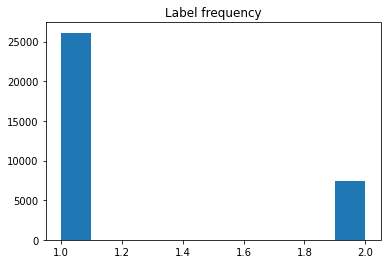

In [6]:
plt.title("Label frequency")
plt.hist(train_df['label'])
plt.show()

In [8]:
#TESTING DATASET

In [5]:
test_df = pd.read_csv(test_txt, sep=',', header=None, names=['img_path', 'x0', 'y0', 'x1', 'y1', 'label'])
test_df.head()

,img_path,x0,y0,x1,y1,label
0,split4_033.png,165,303,493,402,1
1,split4_039.png,157,337,470,425,1
2,split4_057.png,247,404,626,472,1
3,split4_040.png,159,322,477,424,1
4,split4_041.png,164,343,477,421,1


In [8]:
test_df['img_path'].nunique()

158

In [9]:
test_df['label'].value_counts()

1    119
2     42
Name: label, dtype: int64

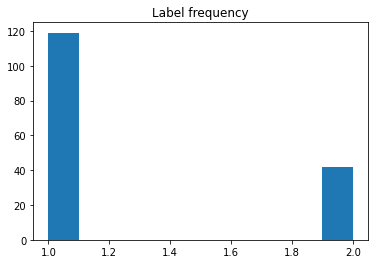

In [10]:
plt.title("Label frequency")
plt.hist(test_df['label'])
plt.show()

# TRAINING

In [6]:
#train shape
print(f"Train shape is {train_df.shape}")

#number of unique images
print(f"Unique images are {train_df['img_path'].nunique()}")

#number of images in dir
folder_images = []
for f in files:
  if "mask" not in f:
    folder_images.append(f)
print(f"Images in folder are {len(folder_images)}")

Train shape is (33581, 6)
Unique images are 6071
Images in folder are 12148


In [7]:
images_ids = train_df['img_path'].unique()

split_len = round(len(images_ids)*0.8) #80% -> train & 20% -> val

train_ids = images_ids[:split_len]
valid_ids = images_ids[split_len:]

train = train_df[train_df['img_path'].isin(train_ids)]
valid = train_df[train_df['img_path'].isin(valid_ids)]

print(f"Train shape is {train.shape} and Validation shape is {valid.shape}")

Train shape is (26861, 6) and Validation shape is (6720, 6)


In [10]:
train['label'].value_counts()

1    20675
2     6186
Name: label, dtype: int64

In [8]:
labels = list(train['label'].values)
class_counts = train['label'].value_counts().tolist()
num_samples = len(labels)
print(num_samples)
class_weights = [class_counts[1]/class_counts[i] for i in range(len(class_counts))]
print(class_weights)
weights = [class_weights[0] if l == 1 else class_weights[1] for l in labels]
print(weights[:10])

26861
[0.2992019347037485, 1.0]
[1.0, 1.0, 0.2992019347037485, 0.2992019347037485, 0.2992019347037485, 1.0, 1.0, 0.2992019347037485, 0.2992019347037485, 1.0]


In [9]:
train['weights'] = weights

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [10]:
train_grouped = train.groupby(['img_path']).sum()
weights = list(train_grouped['weights'].values)
print(len(weights))

4857


In [10]:
valid['label'].value_counts()

1    5450
2    1270
Name: label, dtype: int64

In [11]:
random_list = []

for i in range(15):
    random_list.append(random.randint(0,len(train_df['img_path'].unique())))

print(random_list)

[1392, 5293, 2109, 2198, 1158, 4035, 3274, 969, 4946, 1979, 353, 1355, 3661, 5429, 2767]


In [12]:
FALLEN_COLOR = (255, 0, 0) # Red
NO_FALLEN_COLOR = (0, 255, 0) #Green
TEXT_COLOR = (255, 255, 255) # White
BOX_COLOR = (0, 0, 0) #Black


def visualize_bbox(img, bbox, class_name, thickness=2):
    x_min, y_min, x_max, y_max = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_max), int(y_min), int(y_max)
   
    if class_name == "fallen":
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=FALLEN_COLOR, thickness=thickness)
    else:
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=NO_FALLEN_COLOR, thickness=thickness)
        
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

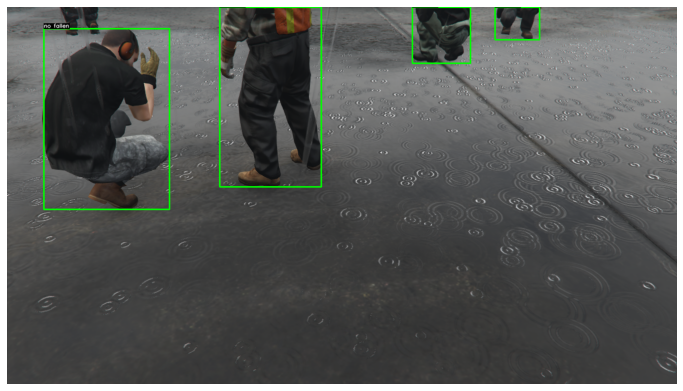

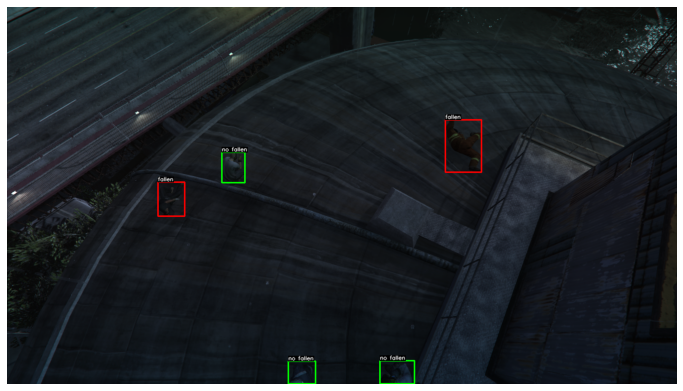

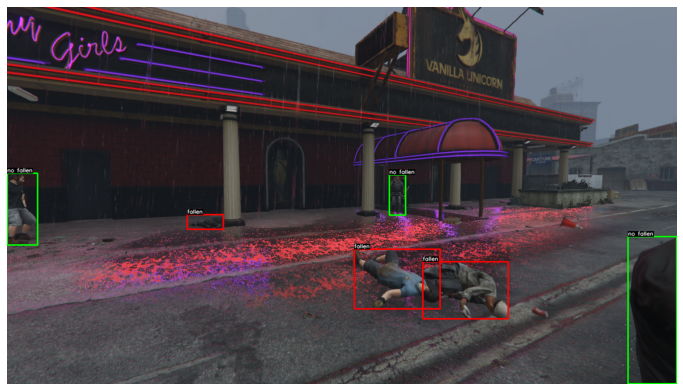

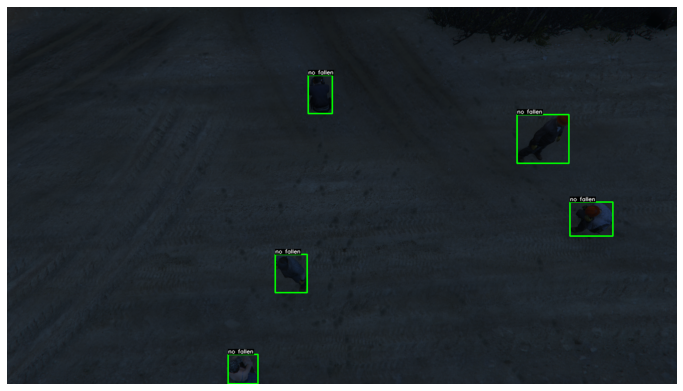

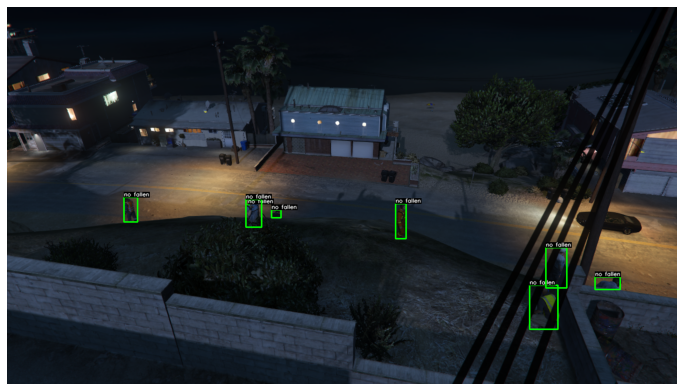

...

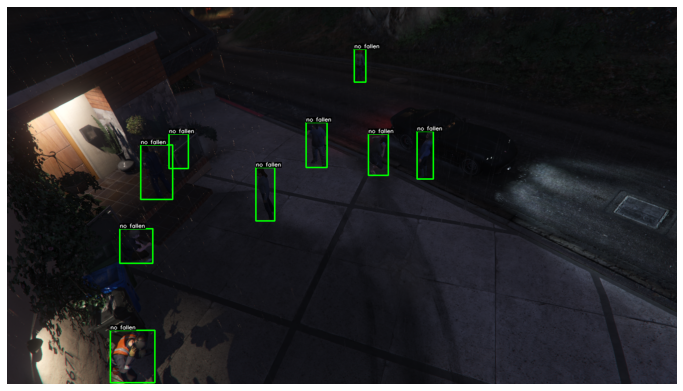

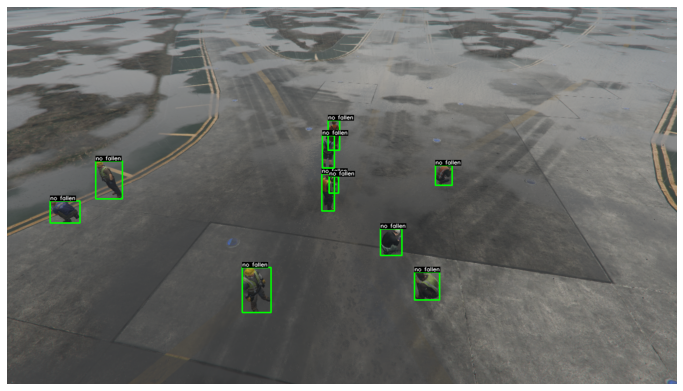

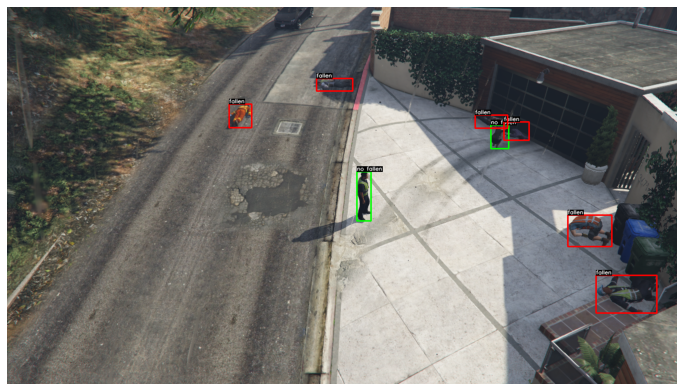

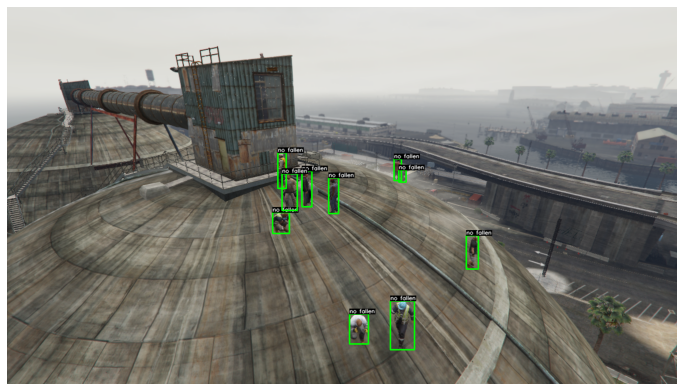

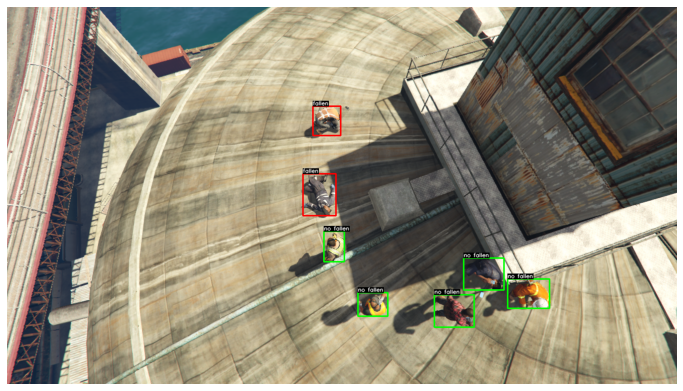

In [14]:
category_id_to_name = {1: 'no fallen', 2: 'fallen'}

for l in random_list:
    img_path = train_df['img_path'][l]
    image = cv2.imread(f'{DATASET}/{img_path}')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    datas = train_df[train_df['img_path'] == img_path]
    bboxes = [[d['x0'], d['y0'], d['x1'], d['y1']] for _, d in datas.iterrows()]
    category_ids = [d['label'] for _,d in datas.iterrows()]
    visualize(image, bboxes, category_ids, category_id_to_name)

In [20]:
#SHOW TESTING IMGS

In [80]:
#TO DO:
from albumentations.pytorch.transforms import ToTensorV2

In [109]:
class FallenPeople(Dataset):

    def __init__(self, dataframe, img_dir, transforms):
        super().__init__()
        self.image_ids = dataframe['img_path'].unique()
        self.df = dataframe
        self.img_dir = img_dir
        self.transforms = transforms

    def __getitem__(self, idx: int):
        image_id = self.image_ids[idx]
        records = self.df[self.df['img_path'] == image_id]

        image = cv2.imread(f'{self.img_dir}/{image_id}', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0

        boxes = records[['x0', 'y0', 'x1', 'y1']].values
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)

        # there is only one class
        labels = records['label'].values
        labels = torch.as_tensor(labels, dtype = torch.int64)
        img_id = torch.tensor([idx])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.uint8)

        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target["image_id"] = img_id
        #target['img_path'] = torch.tensor([idx])
        target['area'] = area
        target['iscrowd'] = iscrowd

#         if self.transforms is not None:
#             image, target = self.transforms(image, target)
            
        if self.transforms:
            augmented = self.transforms(image=image, bboxes = target['boxes'], class_labels = labels) 
            image = augmented['image']
            target['boxes'] = torch.as_tensor(augmented['bboxes'], dtype=torch.float32)

        return image, target

    def __len__(self) -> int:
        return len(self.image_ids)
    
    def train_transform():
        return A.Compose([
        A.RandomCrop(width=450, height=450, p=0.6),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        A.ToGray(p=0.5),
        A.ColorJitter (brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, always_apply=False, p=0.5),
        ToTensorV2(),
    ], bbox_params=A.BboxParams(format='pascal_voc', min_area=1024, min_visibility=0.4, label_fields=['class_labels']))
    
    def valid_test_transform():
        return A.Compose([
      ToTensorV2(p=1.0)
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['class_labels']))

In [16]:
# import math
# import numbers
# import random
# import warnings
# from collections.abc import Sequence
# from typing import Tuple, List, Optional
# from PIL import Image, ImageOps, ImageEnhance

# import torch
# from torch import Tensor

# try:
#     import accimage
# except ImportError:
#     accimage = None

# class ToTensor(object):
#     def __call__(self, image, target):
#         image = F.to_tensor(image)
#         return image, target
# #*********************************************** 

# class Compose(object):
#     def __init__(self, transforms):
#         self.transforms = transforms

#     def __call__(self, image, target):
#         for t in self.transforms:
#             image, target = t(image, target)
#         return image, target
# #***********************************************

# class RandomHorizontalFlip(object):
#     def __init__(self, prob):
#         self.prob = prob

#     def __call__(self, image, target):
#         if random.random() < self.prob:
#             height, width = image.shape[-2:]
#             image = image.flip(-1)
#             bbox = target["boxes"]
#             bbox[:, [0, 2]] = width - bbox[:, [2, 0]]
#             target["boxes"] = bbox
            
#         return image, target
    
# #***********************************************

# class ToPILImage(object):
#     def __init__(self, mode=None):
#         self.mode = mode

#     def __call__(self, pic):
#         return F.to_pil_image(pic, self.mode)
# #***********************************************

# class Grayscale(object):
#     def __init__(self, prob, num_output_channels):
#         self.prob = prob
#         self.num_output_channels = num_output_channels

#     def __call__(self, img, target):
#         if random.random() < self.prob:
#             return to_grayscale(ToPILImage()(img), target, num_output_channels=self.num_output_channels)
#         return img,target

# #***********************************************
# def to_grayscale(img, target, num_output_channels=1):

#     if num_output_channels == 1:
#         img = img.convert('L')
#     elif num_output_channels == 3:
#         img = img.convert('L')
#         np_img = np.array(img, dtype=np.uint8)
#         np_img = np.dstack([np_img, np_img, np_img])
#         img = Image.fromarray(np_img, 'RGB')
#         img = ToTensor()(img,target)
#     else:
#         raise ValueError('num_output_channels should be either 1 or 3')

#     return img

# #***********************************************

# def adjust_brightness(img, target, brightness_factor):
#     enhancer = ImageEnhance.Brightness(img)
#     img = enhancer.enhance(brightness_factor)
#     img = ToTensor()(img,target)
#     return img

# def adjust_contrast(img, target, contrast_factor):
#     enhancer = ImageEnhance.Contrast(img)
#     img = enhancer.enhance(contrast_factor)
#     img = ToTensor()(img,target)
#     return img
# #***********************************************
    
# class ColorBright(object):
#     def __init__(self, prob, brightness=0):
#         self.prob = prob
#         self.brightness = brightness

#     def __call__(self, img, target):
#         #transform = self.get_params(self.brightness, self.contrast,self.saturation, self.hue)
#         if random.random() < self.prob:
#             return adjust_brightness(ToPILImage()(img), target, self.brightness)
#         return img, target
    
# class ColorContrast(object):
#     def __init__(self, prob, contrast=0):
#         self.prob = prob
#         self.contrast = contrast

#     def __call__(self, img, target):
#         #transform = self.get_params(self.brightness, self.contrast,self.saturation, self.hue)
#         if random.random() < self.prob:
#             return adjust_contrast(ToPILImage()(img), target, self.contrast)
#         return img, target

In [17]:
# def get_transform(train):
#     transforms = []
#     # converts the image, a PIL image, into a PyTorch Tensor
#     transforms.append(ToTensor())
#     if train:
#         # during training, randomly flip the training images
#         # and ground-truth for data augmentation
#         transforms.append(RandomHorizontalFlip(0.5))
#         transforms.append(Grayscale(0.5, num_output_channels=3))
#         transforms.append(ColorBright(0.5, brightness=2))
#         transforms.append(ColorContrast(0.5, contrast=2))
#     return Compose(transforms)

In [43]:
# from albumentations.pytorch.transforms import ToTensorV2    
# def get_transform(train):
#     transforms = []
#     transforms.append(ToTensorV2(p=1.0))
#     if train:
#         transforms.append(A.RandomCrop(width=450, height=450))
#         transforms.append(A.HorizontalFlip(p=0.5))
#         transforms.append(A.RandomBrightnessContrast(p=0.2))
#     return A.Compose(transforms, bbox_params=A.BboxParams(format='pascal_voc', min_visibility=0.1, label_fields=['class_labels']))

In [110]:
# train_dataset = FallenPeople(train, DATASET, get_transform(train=True))
# valid_dataset = FallenPeople(valid, DATASET, get_transform(train=False))
# test_dataset = FallenPeople(test_df, TESTING, get_transform(train=False))
train_dataset = FallenPeople(train, DATASET, FallenPeople.train_transform())
valid_dataset = FallenPeople(valid, DATASET, FallenPeople.valid_test_transform())
test_dataset = FallenPeople(test_df, TESTING, FallenPeople.valid_test_transform())

In [19]:
random_list_fp = []

for i in range(15):
    random_list_fp.append(random.randint(0,len(train_dataset)))

print(random_list_fp)

[924, 4720, 2154, 2593, 3994, 3527, 2466, 3986, 2400, 2384, 4254, 4334, 3101, 2030, 805]


In [33]:
def visualize_bbox_tensor(img, bbox, class_name):
    if class_name == "fallen":
        color = FALLEN_COLOR
    else:
        color = NO_FALLEN_COLOR
    x0,y0,x1,y1 = bbox

    draw = ImageDraw.Draw(img)
    draw.rectangle(((x0, y0),(x1,y1)), outline=color, width=3)
    draw.text((x0, y0), class_name)
    return img


def visualize_from_tensor(img,  target, category_id_to_name):
    bboxes = target['boxes'].tolist() 
    category_ids = target['labels'].tolist()
    img = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox_tensor(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

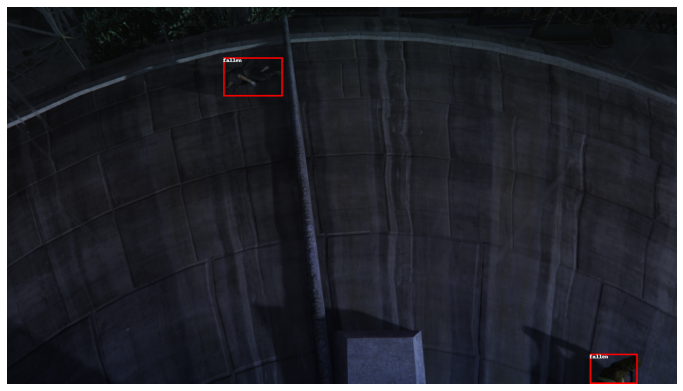

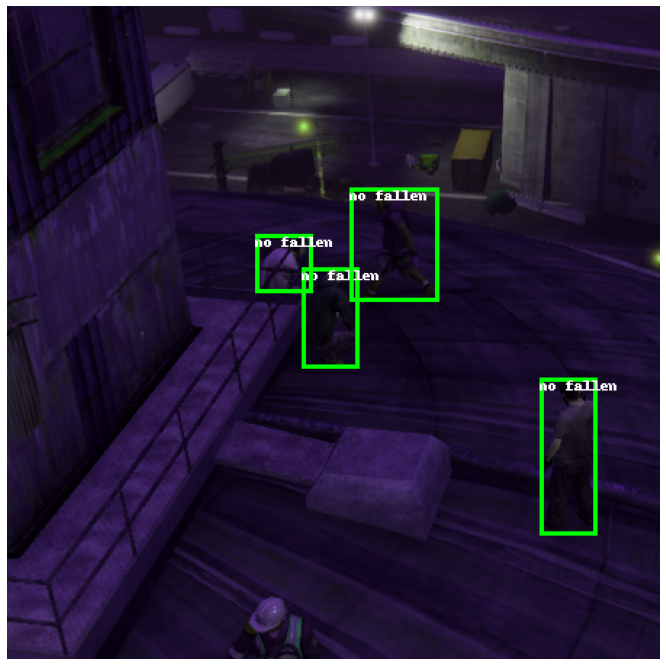

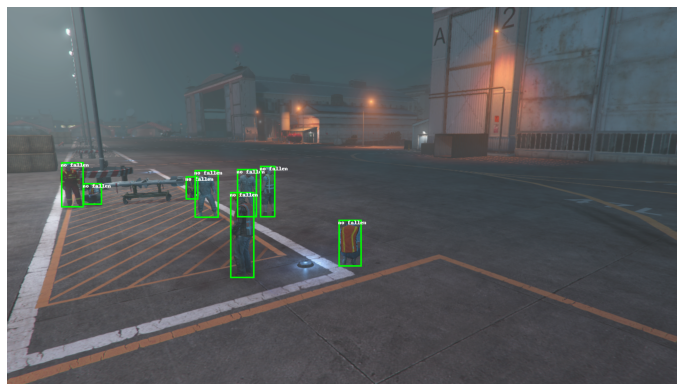

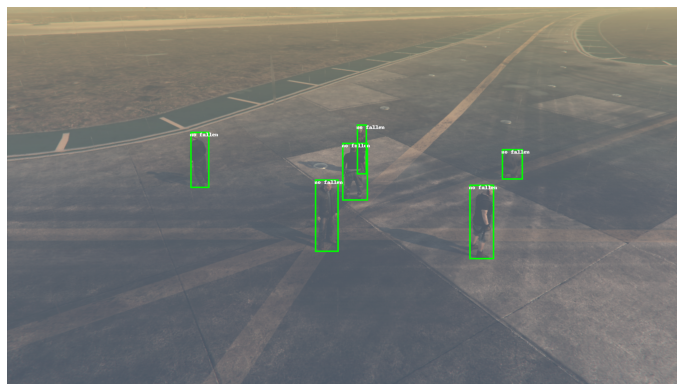

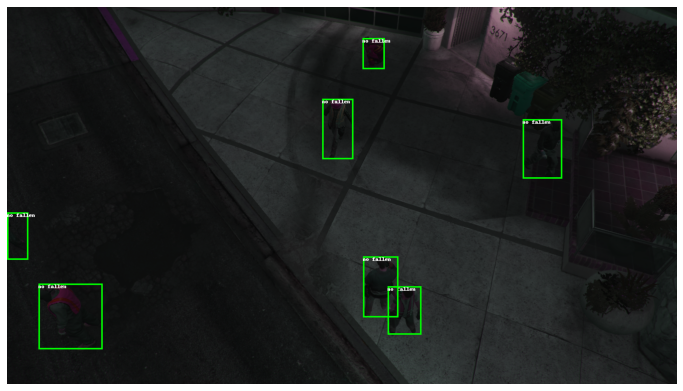

...

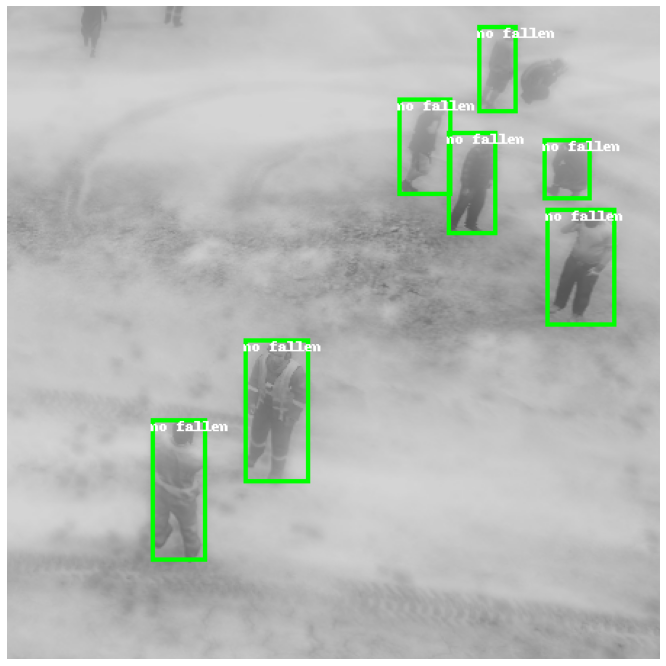

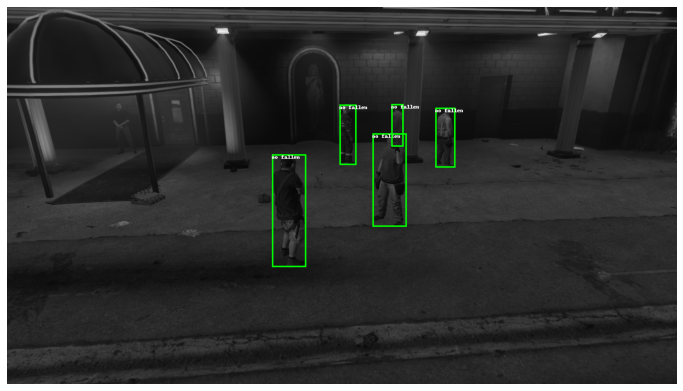

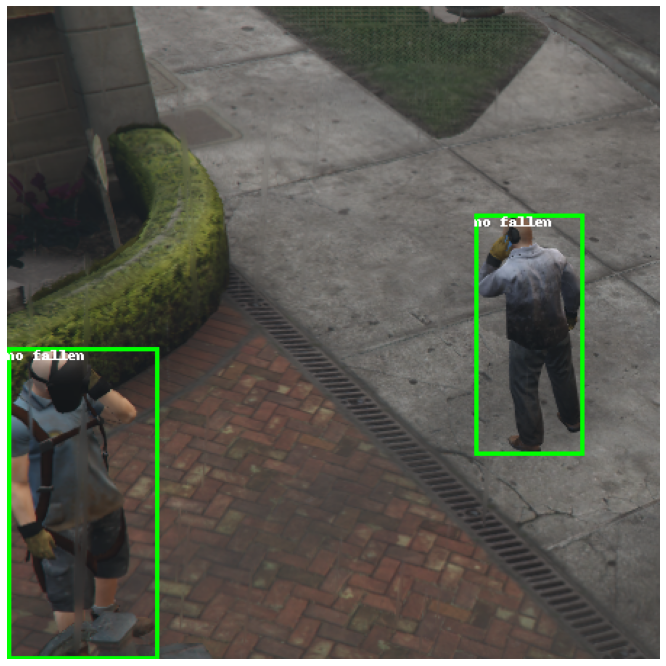

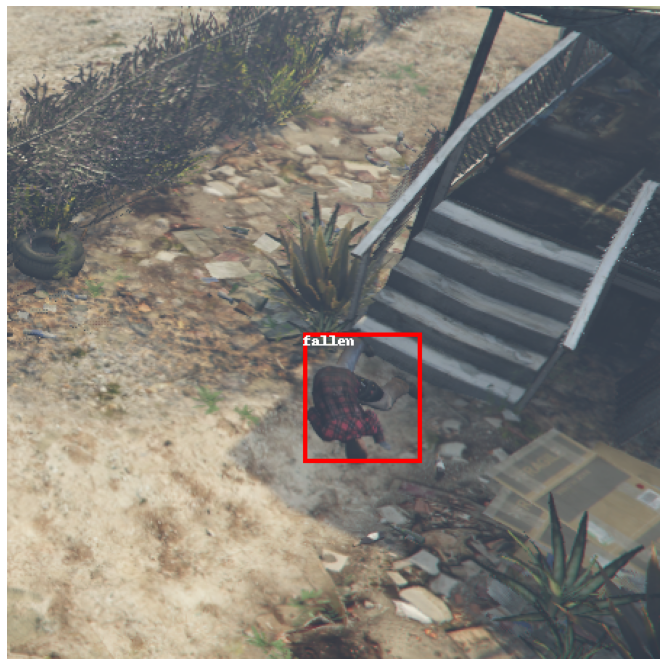

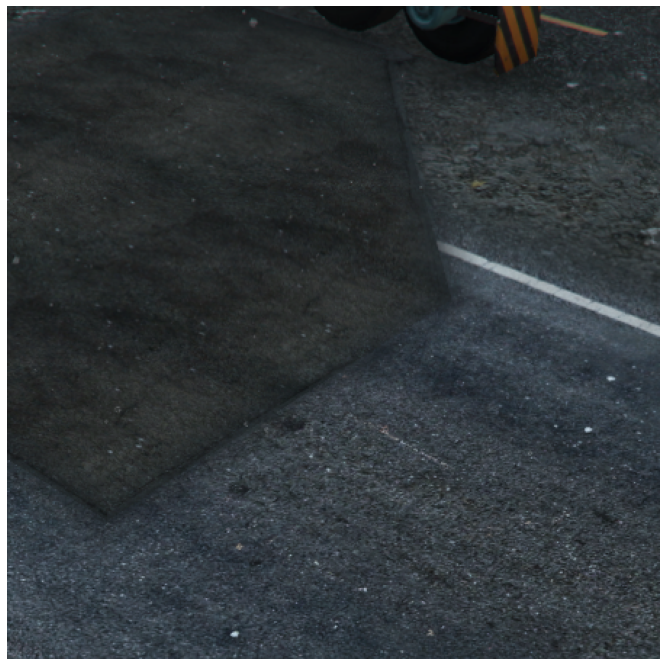

In [111]:
for i in random_list_fp:
    img, target = train_dataset[i]
    visualize_from_tensor(img, target, category_id_to_name)

In [112]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

In [113]:
print(model.roi_heads.box_predictor)

num_classes = 3 # fall or no fall or not(background)

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained model's head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

print(model.roi_heads.box_predictor)

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=91, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=364, bias=True)
)
FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=3, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=12, bias=True)
)


In [114]:
def collate_fn(batch):
  return tuple(zip(*batch))

sampler = torch.utils.data.WeightedRandomSampler(torch.DoubleTensor(weights), int(len(weights)))

train_data_loader = DataLoader(
  train_dataset,
  batch_size=4,
  #shuffle=False,
  collate_fn=collate_fn,
  sampler = sampler
)

valid_data_loader = DataLoader(
  valid_dataset,
  batch_size=4,
  shuffle=False,
  collate_fn=collate_fn
)

test_data_loader = DataLoader(
  test_dataset,
  batch_size=4,
  shuffle=False,
  collate_fn=collate_fn
)

In [115]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
#***************
# move model to the right device
model.to(device)

# create an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# create a learning rate scheduler
#lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
lr_scheduler = None

# train it for 10 epochs
num_epochs = 10

In [31]:
# def bb_intersection_over_union(boxA, boxB):
#     # determine the (x, y)-coordinates of the intersection rectangle
#     boxA = boxA.tolist()
#     boxB = boxB.tolist()
#     l = len(boxB)
#     iou_tot = []
#     for i in range(l): 
#         xA = max(boxA[i][0], boxB[i][0])
#         yA = max(boxA[i][1], boxB[i][1])
#         xB = min(boxA[i][2], boxB[i][2])
#         yB = min(boxA[i][3], boxB[i][3])
#         # compute the area of intersection rectangle
#         interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
#         # compute the area of both the prediction and ground-truth
#         # rectangles
#         boxAArea = (boxA[i][2] - boxA[i][0] + 1) * (boxA[i][3] - boxA[i][1] + 1)
#         boxBArea = (boxB[i][2] - boxB[i][0] + 1) * (boxB[i][3] - boxB[i][1] + 1)
#         # compute the intersection over union by taking the intersection
#         # area and dividing it by the sum of prediction + ground-truth
#         # areas - the interesection area
#         iou = interArea / float(boxAArea + boxBArea - interArea)
#         iou_tot.append(iou)
#     # return the intersection over union value
#     return iou

In [41]:
# def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
#     # You can comment out this line if you are passing tensors of equal shape
#     # But if you are passing output from UNet or something it will most probably
#     # be with the BATCH x 1 x H x W shape
#     outputs = outputs.squeeze(1)  # BATCH x 1 x H x W => BATCH x H x W
    
#     intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
#     union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    
#     iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    
#     thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
#     return thresholded

In [116]:
log_txt = "trainlogs/train_log_25_11_2021.txt"

In [117]:
from engine import evaluate
import sys

original_stdout = sys.stdout

In [118]:
from tqdm.notebook import tqdm as tqdm
#training funzionante
itr = 1

total_train_loss = []
total_valid_loss = []

losses_value = 0.0

f_log = open(log_txt, "w")
for epoch in range(num_epochs):

  start_time = time.time()

  # train ------------------------------
  running_corrects = 0

  model.train()
  train_loss = []
  pbar = tqdm(train_data_loader, desc='let\'s train')
    
  for images, targets in pbar:    

    images = list(image.to(device) for image in images)

    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    loss_dict = model(images, targets)
    losses = sum(loss for loss in loss_dict.values())

    losses_value = losses.item()
    train_loss.append(losses_value)   

    optimizer.zero_grad()
    losses.backward()
    optimizer.step()
    if itr % 10:
        f_log.write(f"Epoch: {epoch+1}, Batch: {itr}, Loss: {losses_value}\n")
    pbar.set_description(f"Epoch: {epoch+1}, Batch: {itr}, Loss: {losses_value}")
    itr += 1
    
  epoch_train_loss = np.mean(train_loss)
  total_train_loss.append(epoch_train_loss)

  # update the learning rate
  if lr_scheduler is not None:
    lr_scheduler.step()
    
  #new valid
  sys.stdout = f_log
  evaluate(model, valid_data_loader, device=device)
  sys.stdout = original_stdout
  # valid -------------------------------------

#   with torch.no_grad():
#     valid_loss = []
    
#     for images, targets in valid_data_loader:
#       images = list(image.to(device) for image in images)
#       targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
#       loss_dict = model(images, targets)
#       losses = sum(loss for loss in loss_dict.values())
#       loss_value = losses.item()
#       valid_loss.append(loss_value)
    
#   epoch_valid_loss = np.mean(valid_loss)
#   total_valid_loss.append(epoch_valid_loss)  

#   # print ------------------------------
#   f_log.write(f"Epoch Completed: {epoch+1}/{num_epochs}, Time: {time.time()-start_time}, "
#         f"Train Loss: {epoch_train_loss}, Valid Loss: {epoch_valid_loss}\n")
#   f_log.write("\nTESTING PHASE: ")

#   print(f"Epoch Completed: {epoch+1}/{num_epochs}, Time: {time.time()-start_time}, "
#         f"Train Loss: {epoch_train_loss}, Valid Loss: {epoch_valid_loss}")
  print("\nTESTING PHASE... ")

  #testing --------------------------------------
  sys.stdout = f_log
  evaluate(model, test_data_loader, device=device)
  sys.stdout = original_stdout
#   with torch.no_grad():
#     valid_loss = []
#     model.eval()
    
#     for images, targets, image_ids in test_data_loader:
#       images = list(image.to(device) for image in images)
#       targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
#       labels = targets[0]['boxes']
#       prediction = model(images)
#       outputs = prediction[0]['boxes']
# #       intersection = torch.logical_and(labels, outputs)
# #       union = torch.logical_or(labels, outputs)
# #       iou_score = torch.sum(intersection) / torch.sum(union)
# #       print("///////////////////////////////")
# #       print(iou_score)
# #       print("///////////////////////////////")
#       iou_score = bb_intersection_over_union(outputs, labels)
#       f_log.write(f"IOU: {iou_score}\n")
#       print("IoU: ", iou_score)
f_log.close()

let's train:   0%|          | 0/1215 [00:00<?, ?it/s]

/usr/local/lib/python3.6/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


ValueError: Expected target boxes to be a tensorof shape [N, 4], got torch.Size([0]).

In [20]:
!nvidia-smi

Fri Nov 19 09:10:40 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.33.01    Driver Version: 440.33.01    CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX 1080    On   | 00000000:03:00.0 Off |                  N/A |
| 28%   37C    P8    11W / 180W |   7689MiB /  8117MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  GeForce GTX 1080    On   | 00000000:04:00.0 Off |                  N/A |
| 28%   33C    P8     7W / 180W |    815MiB /  8119MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
        

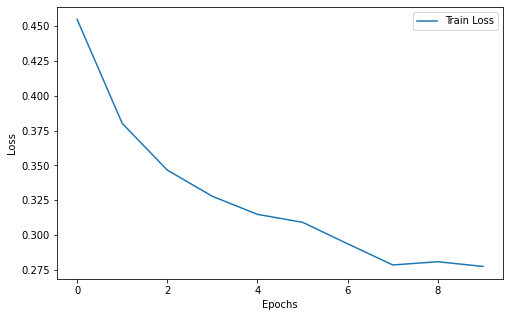

In [71]:
plt.figure(figsize=(8, 5))
plt.plot(total_train_loss, label="Train Loss")
# plt.plot(total_valid_loss, label="Valid Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [72]:
test_dataset[0]

(tensor([[[0.8745, 0.8745, 0.8549,  ..., 0.7020, 0.6863, 0.6471],
          [0.8745, 0.8706, 0.8627,  ..., 0.7059, 0.6902, 0.6431],
          [0.8549, 0.8627, 0.8627,  ..., 0.7137, 0.7137, 0.6510],
          ...,
          [0.9333, 0.9333, 0.9333,  ..., 0.9451, 0.9451, 0.9059],
          [0.9255, 0.9412, 0.9333,  ..., 0.9333, 0.9373, 0.9020],
          [0.9451, 0.9451, 0.9373,  ..., 0.9451, 0.9451, 0.9176]],
 
         [[0.7765, 0.7765, 0.7647,  ..., 0.6196, 0.5961, 0.5569],
          [0.7765, 0.7725, 0.7725,  ..., 0.6235, 0.6000, 0.5529],
          [0.7647, 0.7725, 0.7725,  ..., 0.6314, 0.6235, 0.5608],
          ...,
          [0.9098, 0.9098, 0.9098,  ..., 0.9176, 0.9098, 0.8706],
          [0.8902, 0.9059, 0.9098,  ..., 0.9059, 0.9020, 0.8667],
          [0.9098, 0.9098, 0.9137,  ..., 0.9176, 0.9098, 0.8824]],
 
         [[0.5451, 0.5451, 0.5333,  ..., 0.4784, 0.4549, 0.4157],
          [0.5451, 0.5412, 0.5412,  ..., 0.4824, 0.4588, 0.4118],
          [0.5412, 0.5490, 0.5412,  ...,

In [73]:
# pick one image from the test set
img, _ = test_dataset[0]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

In [74]:
prediction

[{'boxes': tensor([[302.2102, 347.2834, 444.5802, 405.3562],
          [339.3079, 364.6103, 446.3719, 397.7113]], device='cuda:1'),
  'labels': tensor([2, 2], device='cuda:1'),
  'scores': tensor([0.3558, 0.0684], device='cuda:1')}]

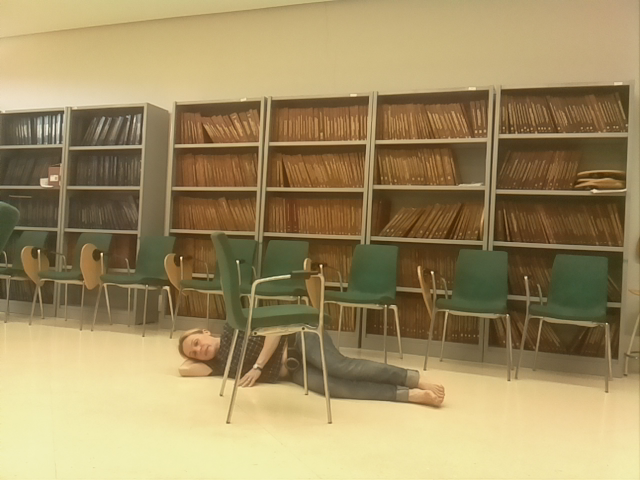

In [75]:
im = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
im

In [76]:
from PIL import ImageDraw, ImageShow, ImageFont

[0.3558327555656433, 0.0683591216802597]


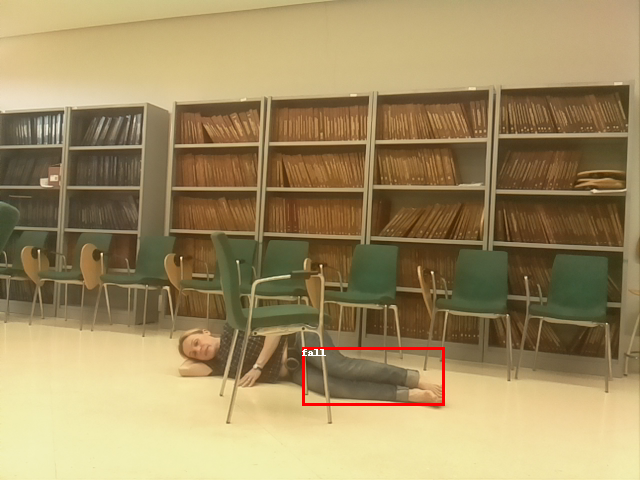

1

In [80]:
boxes = prediction[0]['boxes'].tolist()
labels = prediction[0]['labels'].tolist()
scores = prediction[0]['scores'].tolist()
print(scores)
l = len(scores)
# for b,l,s in boxes,labels,scores:
#     if s > 0.5:
#         if l == 1:
#             color = 'green'
#             text = 'no fall'
#         elif l == 2:
#             color = 'red'
#             text = 'fall'
#         x0,y0,x1,y1 = b
        
#         draw = ImageDraw.Draw(im)
#         draw.rectangle(((x0, y0),(x1,y1)), outline="green", width=3)

for i in range(l):
    if scores[i] > 0.1:
        if labels[i] == 1:
            color = 'green'
            text = 'no fall'
        elif labels[i] == 2:
            color = 'red'
            text = 'fall'
        x0,y0,x1,y1 = boxes[i]
        
        draw = ImageDraw.Draw(im)
        draw.rectangle(((x0, y0),(x1,y1)), outline=color, width=3)
        draw.text((x0, y0), text)
        
ImageShow.show(im)

In [82]:
torch.save(model.state_dict(), 'fasterrcnn_resnet50_fallen_people_v1_2311_balanced_dataset.pth')

In [ ]:
#VEDIAMO UN SAMPLE DEL VALIDATION

In [83]:
valid_dataset[0]

(tensor([[[0.6941, 0.6941, 0.6941,  ..., 0.8157, 0.8196, 0.8196],
          [0.6941, 0.6941, 0.6941,  ..., 0.8157, 0.8196, 0.8196],
          [0.6941, 0.6941, 0.6941,  ..., 0.8157, 0.8196, 0.8196],
          ...,
          [0.4431, 0.4314, 0.4157,  ..., 0.4588, 0.4431, 0.4471],
          [0.4431, 0.4196, 0.3922,  ..., 0.4941, 0.4745, 0.4431],
          [0.4275, 0.4000, 0.3804,  ..., 0.4745, 0.4667, 0.4471]],
 
         [[0.5373, 0.5373, 0.5373,  ..., 0.7059, 0.7059, 0.7059],
          [0.5373, 0.5373, 0.5373,  ..., 0.7059, 0.7059, 0.7059],
          [0.5373, 0.5373, 0.5373,  ..., 0.7059, 0.7059, 0.7059],
          ...,
          [0.3961, 0.3804, 0.3765,  ..., 0.3922, 0.3922, 0.4078],
          [0.3804, 0.3647, 0.3529,  ..., 0.4706, 0.4353, 0.4039],
          [0.3725, 0.3490, 0.3373,  ..., 0.4353, 0.4510, 0.4510]],
 
         [[0.4588, 0.4588, 0.4588,  ..., 0.5961, 0.5961, 0.5961],
          [0.4588, 0.4588, 0.4588,  ..., 0.5961, 0.5961, 0.5961],
          [0.4588, 0.4588, 0.4588,  ...,

In [84]:
# pick one image from the test set
img, _ = valid_dataset[0]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction_valid = model([img.to(device)])

In [85]:
prediction_valid

[{'boxes': tensor([[ 427.9420,  376.8989,  521.9623,  425.4040],
          [ 602.4666,  415.1857,  719.1335,  504.6927],
          [ 308.3056,  268.7635,  328.7566,  338.5441],
          [  12.3476,  265.9731,   50.1099,  349.0907],
          [ 791.4903,  493.7438, 1020.2539,  619.3224],
          [ 308.6019,  269.1282,  326.8897,  304.8794],
          [ 951.7562,  499.1537, 1021.6024,  517.6316]], device='cuda:1'),
  'labels': tensor([2, 2, 1, 1, 2, 1, 2], device='cuda:1'),
  'scores': tensor([0.9982, 0.9964, 0.9950, 0.9943, 0.9936, 0.3456, 0.0819],
         device='cuda:1')}]

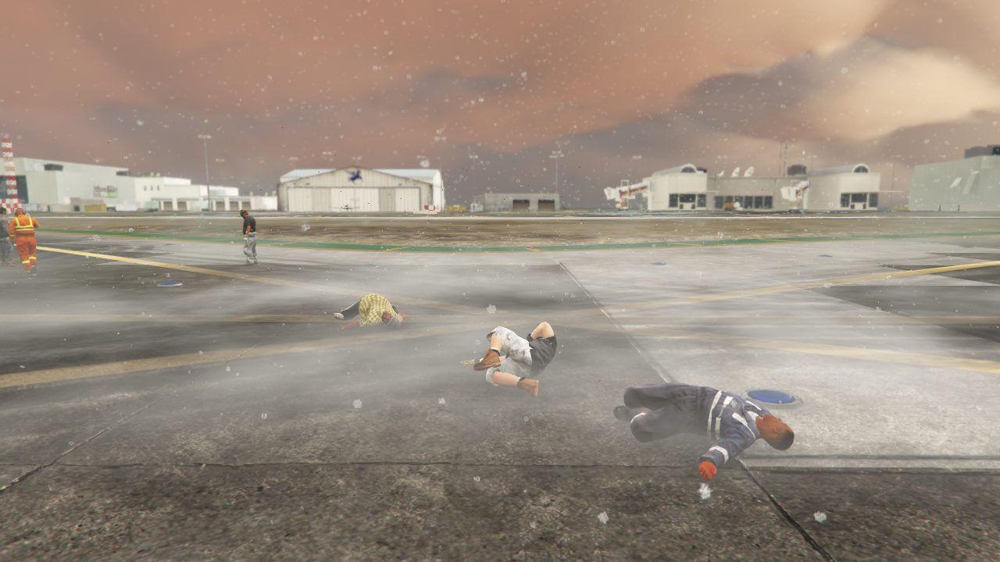

In [86]:
im = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
im

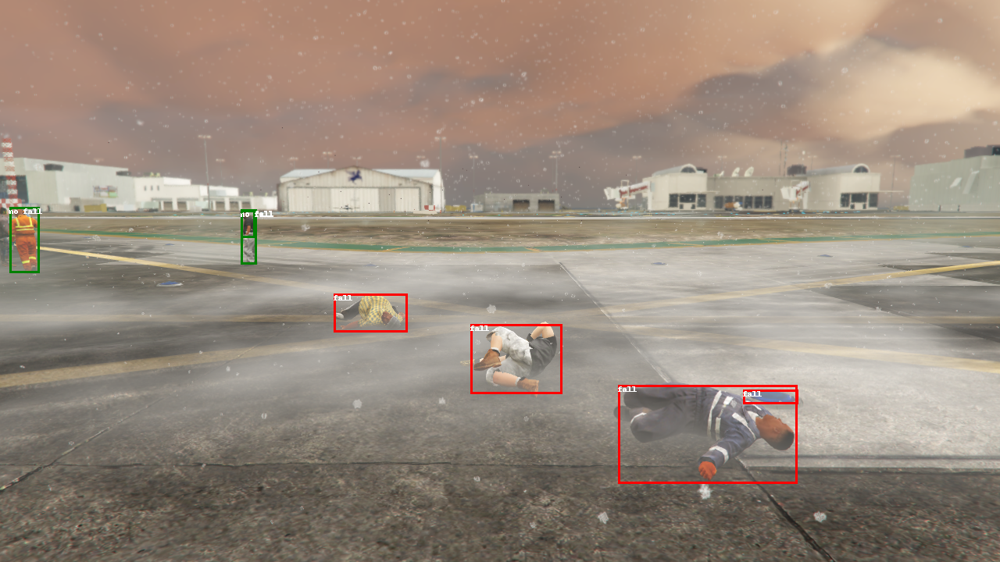

1

In [93]:
boxes = prediction_valid[0]['boxes'].tolist()
labels = prediction_valid[0]['labels'].tolist()
scores = prediction_valid[0]['scores'].tolist()
l = len(scores)
# for b,l,s in boxes,labels,scores:
#     if s > 0.5:
#         if l == 1:
#             color = 'green'
#             text = 'no fall'
#         elif l == 2:
#             color = 'red'
#             text = 'fall'
#         x0,y0,x1,y1 = b
        
#         draw = ImageDraw.Draw(im)
#         draw.rectangle(((x0, y0),(x1,y1)), outline="green", width=3)

for i in range(l):
    if scores[i] > 0.3:
        if labels[i] == 1:
            color = 'green'
            text = 'no fall'
        elif labels[i] == 2:
            color = 'red'
            text = 'fall'
        x0,y0,x1,y1 = boxes[i]
        
        draw = ImageDraw.Draw(im)
        draw.rectangle(((x0, y0),(x1,y1)), outline=color, width=3)
        draw.text((x0, y0), text)
        
ImageShow.show(im)